# 🏨 Airbnb Data Analytics & Visualization Project- By Gangavarapu Sai Sugeet

This project analyzes Airbnb listing data to extract insights on booking patterns, pricing strategies, guest preferences, and host performance.  
It also demonstrates predictive modeling with Scikit-learn.

---

## 🎯 Key Objectives:
1. **Booking Patterns** → Identify peak seasons, location variations, and availability trends.  
2. **Pricing Strategies** → Explore price distributions, neighborhood differences, and reviews impact.  
3. **Guest Preferences** → Analyze room types, amenities, and guest rating trends.  
4. **Host Performance** → Examine top hosts, responsiveness, and listing activity.  
5. **Predictive Modeling** → Build a simple regression model to predict service fee.


In [1]:
# 📦 Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from wordcloud import WordCloud

# ML
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler


In [2]:
from google.colab import files
uploaded = files.upload()

# Load Excel dataset
df = pd.read_excel("Airbnb_Data.xlsx", sheet_name="in")  # change filename if different
df.head()


Saving Airbnb_Data.xlsx to Airbnb_Data.xlsx


,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,...,193.0,10.0,9.0,2021-10-19,0.21,4.0,6.0,286.0,Clean up and treat the home the way you'd like...,NaN
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,...,28.0,30.0,45.0,2022-05-21,0.38,4.0,2.0,228.0,Pet friendly but please confirm with me if the...,NaN
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,NaN,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,...,124.0,3.0,0.0,NaT,NaN,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and...",NaN
3,1002755,NaN,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.68514,-73.95976,United States,...,74.0,30.0,270.0,2019-07-05,4.64,4.0,1.0,322.0,NaN,NaN
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,United States,...,41.0,10.0,9.0,2018-11-19,0.10,3.0,1.0,289.0,"Please no smoking in the house, porch or on th...",NaN


In [3]:
# 🔧 Cleaning

# Drop duplicates
df.drop_duplicates(inplace=True)

# Drop low-value columns
df.drop(['house_rules','license'], axis=1, inplace=True, errors='ignore')

# Remove $ and commas from price/service fee
if 'price' in df.columns:
    df['price'] = df['price'].astype(str).str.replace('$','').str.replace(',','')
if 'service fee' in df.columns:
    df['service fee'] = df['service fee'].astype(str).str.replace('$','').str.replace(',','')

# Rename columns for clarity
df.rename(columns={'service fee':'service_fee'}, inplace=True)

# Convert to numeric
for col in ['price','service_fee']:
    if col in df.columns:
        df[col] = pd.to_numeric(df[col], errors='coerce')

# Fix spelling error
if 'neighbourhood group' in df.columns:
    df['neighbourhood group'] = df['neighbourhood group'].replace({'brookln':'Brooklyn'})

# Convert dates
if 'last review' in df.columns:
    df['last review'] = pd.to_datetime(df['last review'], errors='coerce')

# Remove outliers in availability
if 'availability_365' in df.columns:
    df = df[df['availability_365'] <= 365]

print("Rows:", df.shape[0], "Columns:", df.shape[1])


Rows: 102058 Columns: 24


In [5]:
# Standardize column names (lowercase, replace spaces with underscores)
df.columns = [c.strip().lower().replace(" ", "_") for c in df.columns]


# 📊 1. Booking Patterns


In [6]:
# Availability distribution (Plotly)
fig = px.histogram(df, x="availability_365", nbins=50,
                   title="Availability Distribution (days per year)")
fig.show()

# Reviews over time (Plotly)
if "last review" in df.columns:
    reviews_time = df.groupby(df["last review"].dt.to_period("M")).size().reset_index(name="count")
    reviews_time["last review"] = reviews_time["last review"].dt.to_timestamp()
    fig = px.line(reviews_time, x="last review", y="count", title="Review Activity Over Time")
    fig.show()

# Neighbourhood group distribution (Seaborn)
if "neighbourhood group" in df.columns:
    plt.figure(figsize=(8,5))
    sns.countplot(data=df, x="neighbourhood group", order=df["neighbourhood group"].value_counts().index)
    plt.title("Listings by Neighbourhood Group")
    plt.show()


# 💰 2. Pricing Strategies


In [7]:
# Price distribution (Plotly)
fig = px.histogram(df, x="service_fee", nbins=50, marginal="box", title="Service Fee Distribution")
fig.show()

# Average price by neighbourhood group (Seaborn)
if "neighbourhood group" in df.columns:
    avg_price = df.groupby("neighbourhood group")["price"].mean().reset_index()
    plt.figure(figsize=(8,5))
    sns.barplot(data=avg_price, x="neighbourhood group", y="price")
    plt.title("Average Price by Neighbourhood Group")
    plt.show()

# Price vs Reviews (Plotly scatter)
if "number of reviews" in df.columns:
    fig = px.scatter(df, x="number of reviews", y="price", color="neighbourhood group",
                     title="Price vs Reviews")
    fig.show()


# 🛏️ 3. Guest Preferences


In [8]:
# Room type distribution (Seaborn)
if "room type" in df.columns:
    plt.figure(figsize=(6,5))
    sns.countplot(data=df, x="room type", order=df["room type"].value_counts().index)
    plt.title("Room Type Distribution")
    plt.show()

# Neighbourhood popularity (Plotly)
if "neighbourhood" in df.columns:
    top_neigh = df["neighbourhood"].value_counts().head(10)
    fig = px.bar(top_neigh, x=top_neigh.index, y=top_neigh.values, title="Top 10 Neighbourhoods by Listings")
    fig.show()

# Word Cloud of House Rules
if "house_rules" in df.columns:
    text = " ".join(str(r) for r in df["house_rules"].dropna())
    wordcloud = WordCloud(width=800, height=400, background_color="white").generate(text)
    plt.figure(figsize=(10,5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title("Most Common House Rules")
    plt.show()


# 🗺️ Interactive Map of Airbnb Listings


In [13]:
# 🗺️ Interactive Map of Airbnb Listings
if "lat" in df.columns and "long" in df.columns:
    fig = px.scatter_mapbox(
        df,
        lat="lat",
        lon="long",
        hover_name="name" if "name" in df.columns else None,
        hover_data=["neighbourhood", "service_fee"] if "neighbourhood" in df.columns else None,
        color="service_fee" if "service_fee" in df.columns else None,
        color_continuous_scale="viridis",
        zoom=10,
        height=500,
        title="Airbnb Listings Map (Colored by Service Fee)"
    )
    fig.update_layout(mapbox_style="carto-positron")
    fig.show()


# 👨‍💼 4. Host Performance


In [9]:
# Top hosts by listing count (Seaborn)
if "host name" in df.columns:
    top_hosts = df["host name"].value_counts().head(10)
    plt.figure(figsize=(10,5))
    sns.barplot(x=top_hosts.index, y=top_hosts.values)
    plt.xticks(rotation=45)
    plt.title("Top 10 Hosts by Number of Listings")
    plt.show()

# Host verification (Plotly)
if "host identity verified" in df.columns:
    fig = px.pie(df, names="host identity verified", title="Host Identity Verification Status")
    fig.show()

# Host Listings vs Availability (Seaborn regression)
if "calculated host listings count" in df.columns:
    sns.regplot(data=df, x="calculated host listings count", y="availability_365")
    plt.title("Host Listings Count vs Availability (Regression)")
    plt.show()


# 🔗 Correlation Analysis


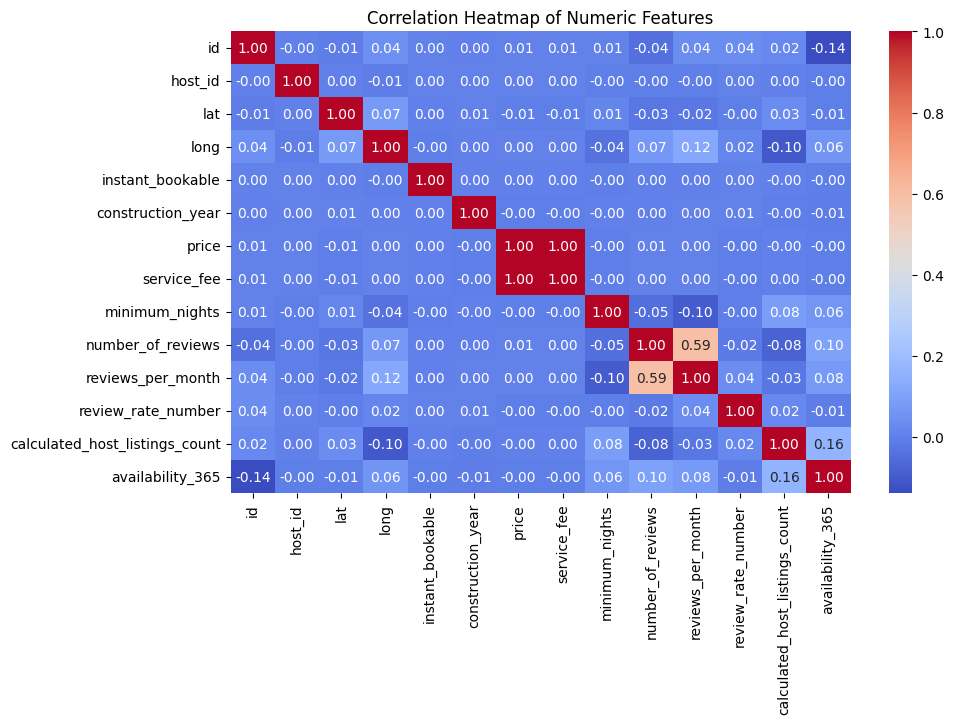

In [11]:
# Select only numeric columns
numeric_df = df.select_dtypes(include=['int64','float64'])

# Correlation matrix
plt.figure(figsize=(10,6))
sns.heatmap(numeric_df.corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap of Numeric Features")
plt.show()


# 🤖 5. Predictive Modeling with Scikit-learn


📊 Linear Regression Results:
Mean Squared Error: 4409.33
R² Score: -0.00


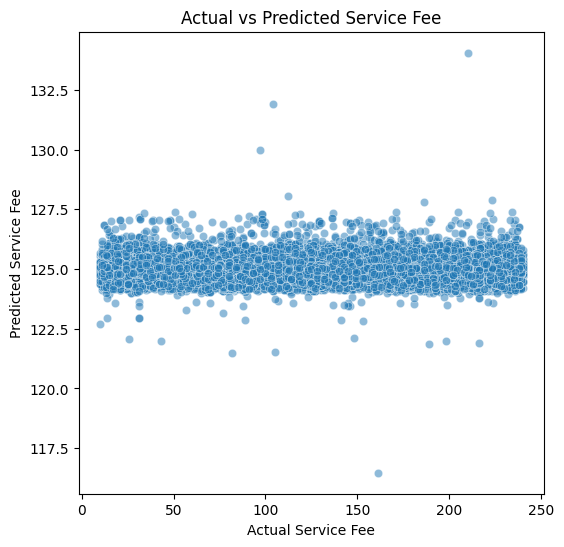

In [10]:
features = ["minimum_nights", "number_of_reviews", "reviews_per_month",
            "calculated_host_listings_count", "availability_365"]
target = "service_fee"

ml_df = df[features + [target]].dropna()
X = ml_df[features]
y = ml_df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

model = LinearRegression()
model.fit(X_train_scaled, y_train)
y_pred = model.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("📊 Linear Regression Results:")
print(f"Mean Squared Error: {mse:.2f}")
print(f"R² Score: {r2:.2f}")

# Actual vs Predicted
plt.figure(figsize=(6,6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.5)
plt.xlabel("Actual Service Fee")
plt.ylabel("Predicted Service Fee")
plt.title("Actual vs Predicted Service Fee")
plt.show()


# ✅ Conclusion

- **Booking Patterns** → Availability varies, reviews show seasonal trends.  
- **Pricing Strategies** → Significant price differences by neighbourhood; reviews don’t always scale with higher price.  
- **Guest Preferences** → Entire apartments dominate; top neighbourhoods show higher demand.  
- **Host Performance** → Few hosts dominate listings; verified hosts inspire trust; more listings often mean higher availability.  
- **Predictive Modeling** → Regression gives a baseline for predicting service fee.  
